In [1]:
import numpy as np
import pandas as pd
import folium
from folium import plugins
from matplotlib import pyplot as plt

from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from catboost import CatBoostClassifier
from pytorch_tabnet.tab_model import TabNetClassifier
import lightgbm as lgbm
from xgboost import XGBClassifier

In [2]:
train = pd.read_csv('train.csv', sep=';')
test = pd.read_csv('test.csv', sep=';')

In [3]:
train.shape, test.shape

((294258, 38), (152766, 38))

# EDA

## Пропуски в данных

In [4]:
def get_nans_df(data):
    total = data.isnull().sum().sort_values(ascending=False) # переменная total, содержащая количество пропусков для каждого признака
    percent = (data.isnull().sum() / data.isnull().count() * 100).sort_values(ascending=False) # доля пропусков для каждого признака
    missing_data = pd.concat([total, percent], axis = 1, keys = ['Total_missing_values', 'Percent %'])
    missing_data['dtype'] = data.dtypes
    missing_data =  missing_data.query('Total_missing_values != 0').reset_index()
    return missing_data

### Train

In [5]:
nans_df_train = get_nans_df(train)
nans_df_train

,index,Total_missing_values,Percent %,dtype
0,f7,145429,49.422276,float64
1,f17,145429,49.422276,float64
2,f16,140535,47.759109,float64
3,f13,127405,43.297039,float64
4,f24,126784,43.085999,float64
5,f28,126784,43.085999,float64
6,f27,126784,43.085999,float64
7,f26,126784,43.085999,float64
8,f25,126784,43.085999,float64
9,f1,36114,12.272903,float64


In [6]:
train.drop(['label','hex_lat','hex_lon'],axis=1).describe()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30
count,258144.000000,262930.000000,265786.000000,279564.000000,279564.000000,281984.000000,148829.000000,280209.000000,280209.000000,294258.000000,...,286899.000000,286899.000000,286899.000000,167474.000000,167474.000000,167474.000000,167474.000000,167474.000000,286899.000000,286899.000000
mean,0.000573,0.000591,0.000745,0.000902,0.000247,0.157069,0.000169,0.000690,0.000955,0.126545,...,0.158855,0.029383,0.000303,0.118867,0.537152,0.003187,0.008172,0.186825,0.008941,0.000097
std,0.001142,0.001101,0.001267,0.003160,0.001825,0.175730,0.002208,0.004673,0.005670,0.001089,...,0.116387,0.059065,0.001089,0.119459,0.273556,0.005874,0.011134,0.284884,0.011068,0.000929
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.103030,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000110,0.000120,0.000160,0.000000,0.000000,0.019820,0.000000,0.000000,0.000000,0.126010,...,0.076490,0.000000,0.000000,0.010160,0.535010,0.000000,0.000000,0.009430,0.001730,0.000000
50%,0.000330,0.000350,0.000450,0.000000,0.000000,0.056150,0.000000,0.000000,0.000000,0.126550,...,0.119050,0.000000,0.000000,0.084110,0.630740,0.000000,0.005330,0.036440,0.006410,0.000000
75%,0.000740,0.000760,0.000970,0.000000,0.000000,0.414520,0.000000,0.000000,0.000000,0.127000,...,0.198240,0.039150,0.000000,0.206473,0.705880,0.004850,0.011490,0.276010,0.012170,0.000000
max,0.314800,0.292930,0.279930,0.206900,0.078260,0.995900,0.541940,0.470790,0.510130,0.144930,...,1.000000,1.000000,0.100000,1.000000,1.000000,0.500000,0.500000,1.000000,1.000000,0.250000


### Test

In [7]:
nans_df_test = get_nans_df(test)
nans_df_test

,index,Total_missing_values,Percent %,dtype
0,f7,73549,48.144875,float64
1,f17,73549,48.144875,float64
2,f16,71560,46.842884,float64
3,f13,65263,42.720893,float64
4,f24,64755,42.388359,float64
5,f28,64755,42.388359,float64
6,f27,64755,42.388359,float64
7,f26,64755,42.388359,float64
8,f25,64755,42.388359,float64
9,f1,16549,10.832908,float64


## Дубликаты

**Train**

In [8]:
print(train.duplicated().sum())

305


In [9]:
train = train.drop_duplicates()
print(train.duplicated().sum())

0


**Test**

In [10]:
print(test.duplicated().sum())
test = test.drop_duplicates()
print(test.duplicated().sum())

77
0


### Найдем категориальные признаки

In [11]:
num_cols_train = train._get_numeric_data().columns
cat_cols_train = list(set(train.columns) - set(num_cols_train))
cat_cols_train

['hex', 'period', 'city_name', 'subject_name', 'subject_type']

**Вывод:**

На первом этапе анализа данных выявлено, что множество признаков f1-f30 имеет пропуски. При этом по **48% пропусков** у признаков **f7 и f17, 46.84% - у f16 и по 42% у признаков f13, f24-f28**. Остальные признаки имеют менее 10% пропусков.

Также в данных имеются дубликаты: 305 - в трейне, 77 - в тесте.

## Проанализируем некоторые признаки

### Label

In [12]:
print('Доля 0 класса в трейне:', train[train['label']==0].shape[0] / train.shape[0])
print('Доля 0 класса в тесте:', test[test['label']==0].shape[0] / test.shape[0])

Доля 0 класса в трейне: 0.9758260674325487
Доля 0 класса в тесте: 0.9789244804799297


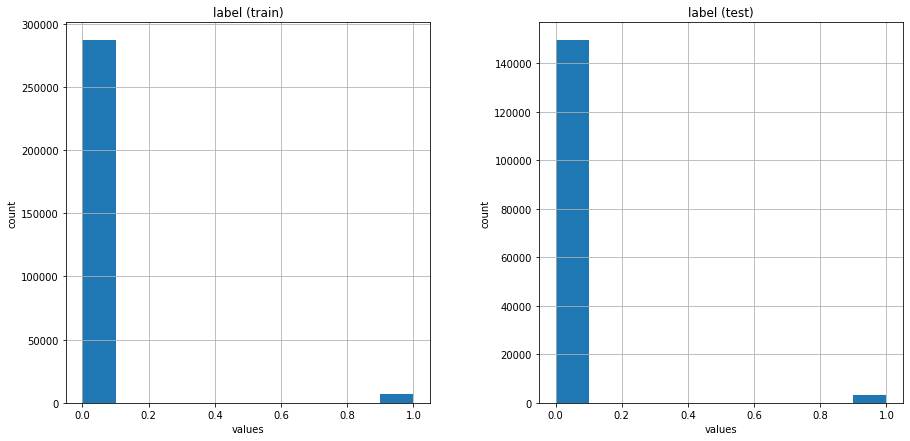

In [13]:
fig,ax = plt.subplots(1,2,figsize=(15,7))
train[['label']].hist(ax=ax[0])
ax[0].set_xlabel('values')
ax[0].set_ylabel('count')
ax[0].set_title('label (train)')

test[['label']].hist(ax=ax[1])
ax[1].set_xlabel('values')
ax[1].set_ylabel('count')
ax[1].set_title('label (test)')
plt.show()

**Вывод:** в наборе данных представлены очень несблансированные классы.

### Period

**Train**

In [14]:
train['period'] = pd.to_datetime(train['period'])

In [15]:
# создадим отдельно признак "месяц", чтобы посмотреть на количество объектов по месяцам
train['month'] = (
    train['period'].dt.floor('d') + pd.offsets.MonthEnd(0) - pd.offsets.MonthBegin(1)
)
#train['month'] = train['period'].dt.month

In [16]:
# train['month'].value_counts().sort_index().plot(title='Кол-во объектов по месяцам (train)');

In [17]:
# посмотрим за какой период представлены данные
print('TRAIN')
print("Year:",train['period'].dt.year.value_counts())
print('Min date:', train['period'].min())
print('Max date:', train['period'].max())

TRAIN
Year: 2020    293953
Name: period, dtype: int64
Min date: 2020-05-01 00:00:00
Max date: 2020-12-01 00:00:00


In [18]:
print('Количество уникальных значений:', train['period'].unique())

Количество уникальных значений: ['2020-05-01T00:00:00.000000000' '2020-06-01T00:00:00.000000000'
 '2020-07-01T00:00:00.000000000' '2020-08-01T00:00:00.000000000'
 '2020-09-01T00:00:00.000000000' '2020-10-01T00:00:00.000000000'
 '2020-11-01T00:00:00.000000000' '2020-12-01T00:00:00.000000000']


**Test** 

Посмотрим данные за какой период представлены в тесте

In [19]:
test['period'] = pd.to_datetime(test['period'])
# создадим отдельно признак "месяц", чтобы посмотреть на количество объектов по месяцам
test['month'] = (
    test['period'].dt.floor('d') + pd.offsets.MonthEnd(0) - pd.offsets.MonthBegin(1)
)
#test['month'] = test['period'].dt.month

In [20]:
# посмотрим за какой период представлены данные
print('TEST')
print("Year:",test['period'].dt.year.value_counts())
print('Min date:', test['period'].min())
print('Max date:', test['period'].max())

TEST
Year: 2021    113136
2020     39553
Name: period, dtype: int64
Min date: 2020-11-01 00:00:00
Max date: 2021-06-01 00:00:00


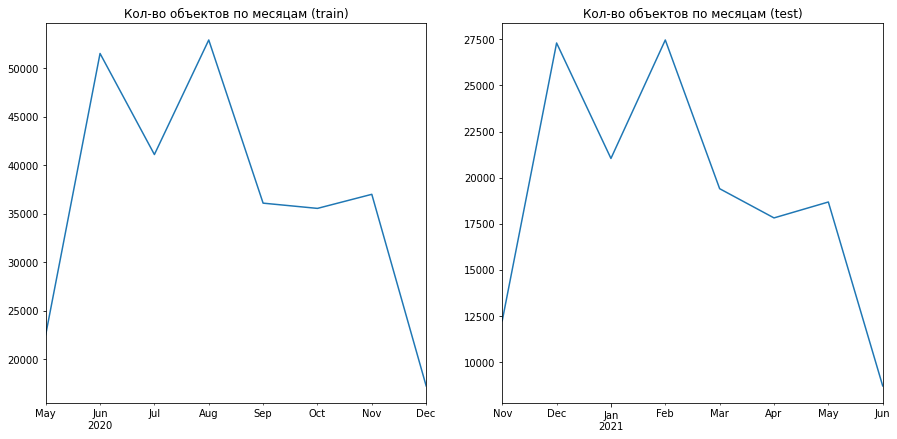

In [21]:
fig,ax = plt.subplots(1,2,figsize=(15,7))
train['month'].value_counts().sort_index().plot(ax=ax[0], title='Кол-во объектов по месяцам (train)');
test['month'].value_counts().sort_index().plot(title='Кол-во объектов по месяцам (test)');

**Вывод:** видим, что в трейне представлены данные с мая по декабрь 2020 года, тогда как в тесте - с ноября 2020 по июнь 2021 года.

### Subject type

In [22]:
len(train['subject_type'].unique())

6

In [23]:
train['subject_type'].value_counts()

Область               165101
Край                   44225
Город                  38427
Республика             36761
Автономный Округ        8955
Автономная Область       484
Name: subject_type, dtype: int64

### Subject name

In [24]:
len(train['subject_name'].unique())

82

In [25]:
train['subject_name'].value_counts()[-10:]

Псковская      742
Адыгея         507
Еврейская      484
Магаданская    443
Калмыкия       418
Алтай          208
Тыва           168
Ингушетия      145
Ненецкий       101
Чукотский        2
Name: subject_name, dtype: int64

### City name

In [26]:
len(train['city_name'].unique())

4634

In [27]:
train['city_name'].value_counts()

Москва              22392
Санкт-Петербург     13805
Новосибирск          5018
Нижний Новгород      4785
Тольятти             3586
                    ...  
Каменное Заделье        1
Старопохвистнево        1
Янгузнарат              1
Большие Маламасы        1
Сюля                    1
Name: city_name, Length: 4633, dtype: int64

In [28]:
train['city_name'].unique()

array(['Москва', 'Коммунарка', 'Марушкино', ..., 'Первая Падь',
       'Нагорное', 'Сюля'], dtype=object)

### HEX

In [29]:
len(train['hex'].unique())

7250

### Hex lat and long

In [30]:
train.columns

Index(['label', 'period', 'subject_type', 'subject_name', 'city_name', 'hex',
       'hex_lat', 'hex_lon', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18',
       'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28',
       'f29', 'f30', 'month'],
      dtype='object')

In [31]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(train[['hex_lat', 'hex_lon']].values, radius=12)
hm.add_to(m)
m

In [32]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(test[['hex_lat', 'hex_lon']].values, radius=12)
hm.add_to(m)
m

### Проанализируем класс 1

array([[<AxesSubplot:title={'center':'label'}>]], dtype=object)

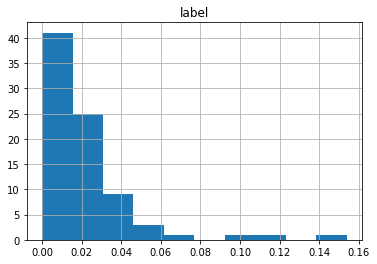

In [33]:
train_gr = train.groupby('subject_name')['label'].mean().reset_index().sort_values(by='label', ascending=False)
train_gr.hist()

In [50]:
train_gr.tail(10)

,subject_name,label
41,Московская,0.005458
73,Ульяновская,0.005345
56,Самарская,0.005237
66,Татарстан,0.005220
78,Чувашская,0.004690
50,Пензенская,0.004535
58,Саратовская,0.004228
14,Дагестан,0.002591
6,Башкортостан,0.002246
79,Чукотский,0.000000


In [30]:
class1 = train[train['label'] == 1]
class1.shape

(7106, 39)

In [61]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(class1[['hex_lat', 'hex_lon']].values, radius=12)
hm.add_to(m)
m

In [33]:
class1['subject_name'].value_counts()

Мурманская         869
Москва             711
Коми               437
Санкт-Петербург    432
Новосибирская      359
                  ... 
Адыгея               5
Калмыкия             5
Алтай                3
Ингушетия            3
Дагестан             2
Name: subject_name, Length: 81, dtype: int64

In [34]:
test_class1 = test[test['label']==1]
test_class1.shape

(3218, 39)

In [35]:
test_class1['subject_name'].value_counts()

Санкт-Петербург    335
Москва             293
Мурманская         217
Краснодарский      163
Ростовская         133
                  ... 
Ивановская           3
Ярославская          2
Тыва                 2
Еврейская            2
Магаданская          1
Name: subject_name, Length: 80, dtype: int64

### Adding data

In [39]:
zp = pd.read_excel('tab2-zpl_05.xlsx', sheet_name=1)
zp

,Unnamed: 0,январь,февраль,март,апрель,май,июнь,июль,август,сентябрь,...,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41
0,Российская Федерация,49516.3,51228.8,55207.7,56613.9,56171.3,58781.7,55169.8,52355.1,54687.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Центральный федеральный округ,62060.0,66414.3,73321.9,74774.2,69933.7,73177.1,71383.2,66353.5,68697.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Белгородская область,37801.9,36393.4,39487.2,40280.8,39730.8,41619.7,42958.6,40321.8,40651.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Брянская область,31237.8,31510.2,33005.5,34577.6,37007.8,38015.8,35232.8,34398.2,35295.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Владимирская область,33808.2,34569.8,36405.9,37154.4,37454.9,39754.1,37410.1,36360.4,37431.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,Амурская область,52396.5,52087.5,56966.0,57012.6,58191.8,59665.6,58706.6,57546.5,57436.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93,Магаданская область,97724.4,99781.2,99525.4,112421.5,118093.7,109258.6,104602.1,93984.2,97989.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
94,Сахалинская область,96935.2,88149.9,91116.5,91886.3,95662.4,96658.3,95505.9,89134.4,88377.7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95,Еврейская авт.область,44097.1,44074.2,46931.8,48851.6,51280.5,52402.1,49065.6,46722.4,49305.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
zp = zp[zp.columns[:13]]
zp

,Unnamed: 0,январь,февраль,март,апрель,май,июнь,июль,август,сентябрь,октябрь,ноябрь,декабрь
0,Российская Федерация,49516.3,51228.8,55207.7,56613.9,56171.3,58781.7,55169.8,52355.1,54687.1,54649.0,55639.4,77994.2
1,Центральный федеральный округ,62060.0,66414.3,73321.9,74774.2,69933.7,73177.1,71383.2,66353.5,68697.5,69335.3,70271.6,105705.5
2,Белгородская область,37801.9,36393.4,39487.2,40280.8,39730.8,41619.7,42958.6,40321.8,40651.2,42444.3,41878.0,52616.0
3,Брянская область,31237.8,31510.2,33005.5,34577.6,37007.8,38015.8,35232.8,34398.2,35295.4,35929.8,35912.9,44807.9
4,Владимирская область,33808.2,34569.8,36405.9,37154.4,37454.9,39754.1,37410.1,36360.4,37431.1,37083.2,37575.9,47485.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,Амурская область,52396.5,52087.5,56966.0,57012.6,58191.8,59665.6,58706.6,57546.5,57436.5,59165.3,59771.7,81303.1
93,Магаданская область,97724.4,99781.2,99525.4,112421.5,118093.7,109258.6,104602.1,93984.2,97989.9,100123.1,126821.1,141196.0
94,Сахалинская область,96935.2,88149.9,91116.5,91886.3,95662.4,96658.3,95505.9,89134.4,88377.7,91094.5,92340.0,118179.9
95,Еврейская авт.область,44097.1,44074.2,46931.8,48851.6,51280.5,52402.1,49065.6,46722.4,49305.0,49489.9,48891.3,69352.1


In [68]:
#test_class1[test_class1['subject_name']=='Белгородская']

# Model

### Data preparation

In [38]:
train.columns

Index(['label', 'period', 'subject_type', 'subject_name', 'city_name', 'hex',
       'hex_lat', 'hex_lon', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18',
       'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28',
       'f29', 'f30', 'month'],
      dtype='object')

In [39]:
# удалим из обучающей выборки целевую метку, а также признак month, созданный во время EDA

X_train = train.drop(['label','month'], axis=1)
y_train = train[['label']]

X_test = test.drop(['label','month'], axis=1)
y_test = test[['label']]

In [48]:
# преобразуем тип признака period из datetime в str для подачи модели

X_train['period'] = X_train['period'].astype(str)
X_test['period'] = X_test['period'].astype(str)

X_train['city_name'] = X_train['city_name'].astype(str)
X_test['city_name'] = X_test['city_name'].astype(str)

#X_train['month'] = X_train['period'].dt.month
#X_test['month'] = X_test['period'].dt.month

#X_train['year'] = X_train['period'].dt.year
#X_test['year'] = X_test['period'].dt.year

### CatBoost

In [49]:
model = CatBoostClassifier()

In [50]:
cat_cols_train
X_train.columns

Index(['period', 'subject_type', 'subject_name', 'city_name', 'hex', 'hex_lat',
       'hex_lon', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20',
       'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30'],
      dtype='object')

In [51]:
model = model.fit(X_train, y_train, cat_features=cat_cols_train, eval_set=(X_test,y_test))

Learning rate set to 0.128995
0:	learn: 0.4921362	test: 0.4914404	best: 0.4914404 (0)	total: 545ms	remaining: 9m 4s
1:	learn: 0.3551835	test: 0.3563884	best: 0.3563884 (1)	total: 1.07s	remaining: 8m 54s
2:	learn: 0.2706474	test: 0.2664125	best: 0.2664125 (2)	total: 1.33s	remaining: 7m 21s
3:	learn: 0.2145342	test: 0.2106875	best: 0.2106875 (3)	total: 1.62s	remaining: 6m 43s
4:	learn: 0.1766679	test: 0.1726935	best: 0.1726935 (4)	total: 1.87s	remaining: 6m 12s
5:	learn: 0.1517633	test: 0.1623395	best: 0.1623395 (5)	total: 2.14s	remaining: 5m 54s
6:	learn: 0.1382644	test: 0.1457508	best: 0.1457508 (6)	total: 2.23s	remaining: 5m 16s
7:	learn: 0.1271814	test: 0.1427256	best: 0.1427256 (7)	total: 2.48s	remaining: 5m 7s
8:	learn: 0.1186981	test: 0.1308037	best: 0.1308037 (8)	total: 2.82s	remaining: 5m 10s
9:	learn: 0.1125689	test: 0.1280602	best: 0.1280602 (9)	total: 3.21s	remaining: 5m 17s
10:	learn: 0.1087970	test: 0.1211433	best: 0.1211433 (10)	total: 3.52s	remaining: 5m 16s
11:	learn: 0.

In [53]:
y_pred = model.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])